# Interpolation!

In [9]:
%load_ext autoreload
%autoreload 2

In [14]:
import pandas as pd
from scripts.utils import filter_person_and_date
from scripts.MapMatch import MapMatch
from scripts.Segment import Segment
from scripts.PlotMap import PlotMap

In [15]:
all_plt_data = pd.read_csv('../flask-app/static/data/all_plt_data.csv')

## Download the Beijing network data
Downloads all nodes (intersections) and edges (roads) for 'all' types, includes driving, foot, bike, etc. paths

In [7]:
import osmnx as ox
beijing_network = ox.graph_from_place('Beijing, China', network_type='all')

/Users/sarah/Desktop/caspar/pre-walkwise/gps-venv/lib/python3.12/site-packages/osmnx/_overpass.py:254: UserWarning: This area is 11 times your configured Overpass max query area size. It will automatically be divided up into multiple sub-queries accordingly. This may take a long time.
  multi_poly_proj = utils_geo._consolidate_subdivide_geometry(poly_proj)


In [8]:
nodes, edges = ox.graph_to_gdfs(beijing_network)

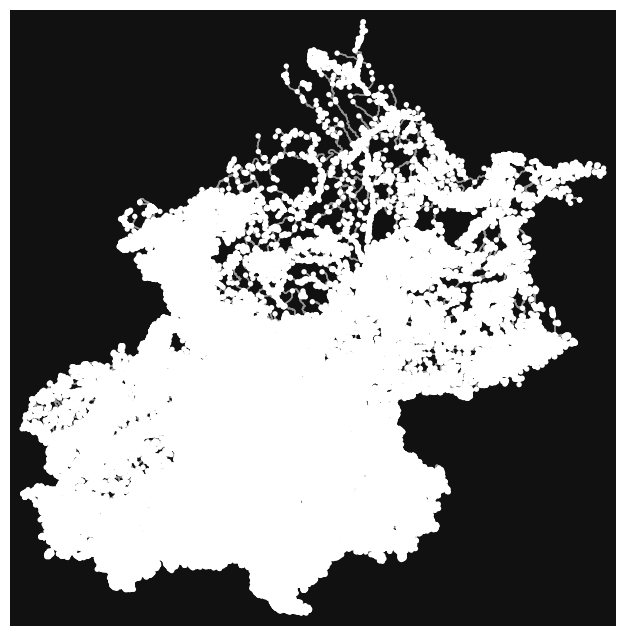

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [13]:
m = ox.plot_graph(beijing_network)
m

## Inputs: A map-matched dataset

In [16]:
person_df = filter_person_and_date(all_plt_data, 80, '2007-07-06')

segment_df = Segment.segment_df(person_df)
ksegment_df = Segment.kalman_filter_segments(segment_df)

meili_json = MapMatch.meili_match(ksegment_df)
trace_df = MapMatch.make_tracedf(meili_json, ksegment_df)

Split indices: [0, 1, 11, 13, 14, 15, 17, 22, 31, 35, 36, 54, 56]
note: df has <2 rows, skipping kalman filter
note: df has <2 rows, skipping kalman filter
note: df has <2 rows, skipping kalman filter
note: df has <2 rows, skipping kalman filter


In [67]:
pm = PlotMap(person_df, tile_type='light')
# pm.polyline(ksegment_df, 'kalman')
pm.polyline(trace_df, 'matched')

# pm.circles(ksegment_df, 'kalman')
pm.circles(trace_df, 'matched')
pm.show()

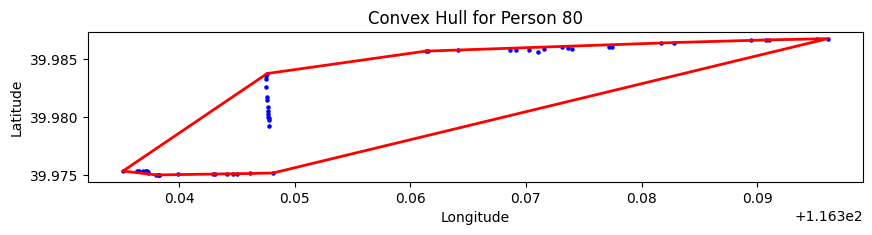

In [29]:
from shapely import Point, MultiPoint
import geopandas as gpd
import matplotlib.pyplot as plt

# Filter out rows where either 'matched_lon' or 'matched_lat' is NaN
filtered_trace_df = trace_df.dropna(subset=['matched_long', 'matched_lat'])

# Create Point objects only for valid coordinates
tracepoints = [Point(xy) for xy in zip(filtered_trace_df['matched_long'], filtered_trace_df['matched_lat'])]
multi_tracepts = MultiPoint(tracepoints)
convex_hull = multi_tracepts.convex_hull

gdf = gpd.GeoDataFrame({'geometry': tracepoints})
gdf_hull = gpd.GeoDataFrame({'geometry': [convex_hull]})

# Plot the points and the convex hull
ax = gdf.plot(color='blue', marker='o', markersize=5, figsize=(10, 10))
gdf_hull.boundary.plot(ax=ax, color='red', linewidth=2)

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Convex Hull for Person 80')
plt.show()

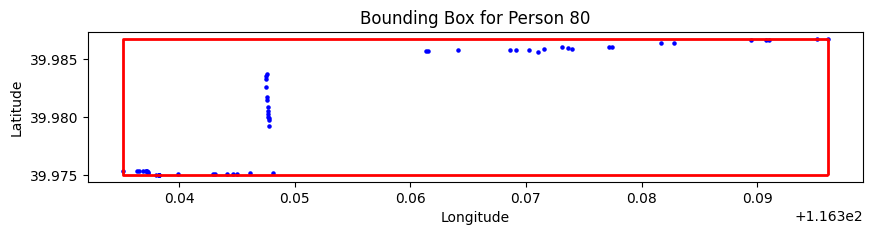

In [28]:
from shapely import Polygon, box

min_lat, max_lat = filtered_trace_df['matched_lat'].min(), filtered_trace_df['matched_lat'].max()
min_lon, max_lon = filtered_trace_df['matched_long'].min(), filtered_trace_df['matched_long'].max()

bounding_box = box(min_lon, min_lat, max_lon, max_lat)

tracepoints = [Point(xy) for xy in zip(filtered_trace_df['matched_long'], filtered_trace_df['matched_lat'])]
gdf = gpd.GeoDataFrame({'geometry': tracepoints})
gdf_box = gpd.GeoDataFrame({'geometry': [bounding_box]})

# Plot the points and the bounding box
ax = gdf.plot(color='blue', marker='o', markersize=5, figsize=(10, 10))
gdf_box.boundary.plot(ax=ax, color='red', linewidth=2)

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Bounding Box for Person 80')
plt.show()

In [47]:
import osmnx as ox

bbox = (min_lat, max_lat, min_lon, max_lon)
person_network = ox.graph.graph_from_bbox(bbox=bbox, network_type='all')
person_nodes, person_edges = ox.graph_to_gdfs(person_network)

/var/folders/_1/wpkj3xlj2sxd981vsh_0fhd80000gn/T/ipykernel_67822/3147960897.py:4: FutureWarning: The expected order of coordinates in `bbox` will change in the v2.0.0 release to `(left, bottom, right, top)`.
  person_network = ox.graph.graph_from_bbox(bbox=bbox, network_type='all')


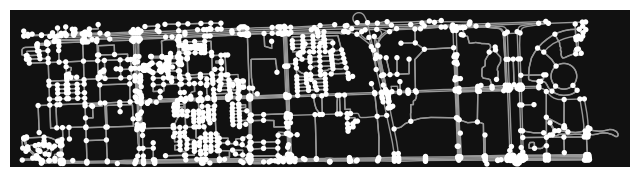

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [48]:
person_m = ox.plot_graph(person_network)
person_m

In [57]:
def make_node_df(person_nodes):
    node_df = person_nodes.copy()
    node_df.reset_index(inplace=True, drop=False)
    node_df.rename(columns={'index': 'osmid', 'x': 'node_long', 'y': 'node_lat'}, inplace=True)
    return node_df

node_df = make_node_df(person_nodes)
node_df


,osmid,node_lat,node_long,highway,street_count,ref,geometry
0,27477662,39.982995,116.363334,crossing,4,NaN,POINT (116.36333 39.98299)
1,31204690,39.981300,116.388264,NaN,4,NaN,POINT (116.38826 39.98130)
2,31204696,39.980950,116.391756,NaN,3,NaN,POINT (116.39176 39.98095)
3,31204703,39.981022,116.394445,NaN,3,NaN,POINT (116.39445 39.98102)
4,31204892,39.981422,116.393997,NaN,3,NaN,POINT (116.39400 39.98142)
...,...,...,...,...,...,...,...
1407,11968678570,39.977201,116.395204,NaN,3,NaN,POINT (116.39520 39.97720)
1408,11968678572,39.977201,116.395601,NaN,3,NaN,POINT (116.39560 39.97720)
1409,11968678576,39.980319,116.395215,NaN,3,NaN,POINT (116.39521 39.98032)
1410,11984542173,39.977959,116.395612,NaN,3,NaN,POINT (116.39561 39.97796)


In [77]:
pm = PlotMap(person_df, tile_type='light')

pm.polyline(trace_df, 'matched')
pm.circles(trace_df, 'matched')
pm.circles(node_df, 'network')

pm.show()

In [76]:
def make_edge_df(person_edges):
    edge_df = person_edges.copy()
    edge_df.reset_index(inplace=True, drop=False)
    edge_df.rename(columns={'index': 'u,v,key'}, inplace=True)
    return edge_df

edge_df = make_edge_df(person_edges)
edge_df

,u,v,key,osmid,highway,oneway,reversed,length,name,geometry,lanes,bridge,maxspeed,ref,width,tunnel,service
0,27477662,297113666,0,162970644,footway,False,False,8.263,NaN,"LINESTRING (116.36333 39.98299, 116.36343 39.9...",NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,27477662,1747588121,0,162970644,footway,False,True,11.068,NaN,"LINESTRING (116.36333 39.98299, 116.36320 39.9...",NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,27477662,2363166330,0,1067936659,primary,True,False,265.001,花园东路,"LINESTRING (116.36333 39.98299, 116.36340 39.9...",NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,31204690,10004080015,0,24691220,secondary,True,False,16.347,北辰路,"LINESTRING (116.38826 39.98130, 116.38826 39.9...",5,NaN,NaN,NaN,NaN,NaN,NaN
4,31204690,10004080013,0,97291935,secondary_link,True,False,17.167,NaN,"LINESTRING (116.38826 39.98130, 116.38806 39.9...",NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3387,11968678570,6784237725,0,723298100,unclassified,False,True,19.889,冬奥村南街,"LINESTRING (116.39520 39.97720, 116.39544 39.9...",NaN,NaN,NaN,NaN,NaN,NaN,NaN
3388,11968678572,6784237725,0,723298104,unclassified,False,False,13.941,冬奥村南街,"LINESTRING (116.39560 39.97720, 116.39544 39.9...",NaN,NaN,NaN,NaN,NaN,NaN,NaN
3389,11968678572,11984542173,0,"[1290881738, 1290881740]",service,True,False,84.302,NaN,"LINESTRING (116.39560 39.97720, 116.39560 39.9...",NaN,NaN,NaN,NaN,NaN,yes,NaN
3390,11984542173,11968678576,0,"[1290881738, 1290881739]",service,True,False,265.028,NaN,"LINESTRING (116.39561 39.97796, 116.39561 39.9...",NaN,NaN,NaN,NaN,NaN,yes,NaN


In [88]:
pm = PlotMap(person_df, tile_type='light')

# Underlying street grid network
pm.edge_polyline(edge_df)
pm.circles(node_df, 'network')

# Original person data
pm.polyline(person_df, 'original')
pm.circles(person_df, 'original')

# Matched GPS data
pm.polyline(trace_df, 'matched')
pm.circles(trace_df, 'matched')

pm.show()

### Get the nearest node on the same edge

In [105]:
def get_nearest_node(person_network, point):
    """
    Given a point (latitude, longitude) and a network graph,
    find the nearest node and its coordinates.
    
    Parameters:
    - person_network: networkx.MultiDiGraph
    - point: tuple (latitude, longitude)
    
    Returns:
    - nearest_node: int (node identifier)
    - nearest_node_coords: tuple (latitude, longitude)
    """
    def get_euclidean_dist(point1, point2):
        """Calculate the Euclidean distance between two points."""
        return ((point1[0] - point2[0]) ** 2 + (point1[1] - point2[1]) ** 2) ** 0.5

    # Extract latitude and longitude from the input point
    orig_lat, orig_lon = point
    
    # Find the nearest edge and the distance to it
    nearest_edge, nearest_edge_dist = ox.distance.nearest_edges(person_network, orig_lon, orig_lat, return_dist=True)
    u, v, key = nearest_edge

    # Get the coordinates of the two nodes
    u_coords = (person_network.nodes[u]['y'], person_network.nodes[u]['x'])  # (lat, lon)
    v_coords = (person_network.nodes[v]['y'], person_network.nodes[v]['x'])  # (lat, lon)

    # Calculate distances from the origin point to the two nodes
    u_dist = get_euclidean_dist(u_coords, point)
    v_dist = get_euclidean_dist(v_coords, point)

    # Determine the nearest node
    if u_dist < v_dist:
        nearest_node = u
        nearest_node_coords = u_coords
    else:
        nearest_node = v
        nearest_node_coords = v_coords

    return nearest_node, nearest_node_coords

origin_pt = (39.983749, 116.347627)
nearest_node, nearest_node_coords = get_nearest_node(person_network, origin_pt)
nearest_node, nearest_node_coords

(1350327452, (39.9837881, 116.3476397))

In [106]:
origin_gps = (39.983749, 116.347627)
dest_gps = (39.985683, 116.361321)

origin_node = get_nearest_node(person_network, origin_gps)[0]
dest_node = get_nearest_node(person_network, dest_gps)[0]

origin_node, dest_node

(1350327452, 9048204813)

In [107]:
shortest_path = ox.shortest_path(person_network, origin_node, dest_node, weight='length')
shortest_path

[1350327452,
 35864175,
 292592675,
 35864448,
 1870647778,
 3016153365,
 35864450,
 1870668782,
 11879353646,
 511980201,
 9048204813]

In [109]:
shortest_path_rows = []
for node in shortest_path:
    node_data = person_nodes[person_nodes.index == node]
    shortest_path_rows.append(node_data)
shortest_path_df = pd.concat(shortest_path_rows)

shortest_path_df

,y,x,highway,street_count,ref,geometry
osmid,,,,,,
1350327452,39.983788,116.347640,NaN,3,NaN,POINT (116.34764 39.98379)
35864175,39.985047,116.347609,NaN,3,NaN,POINT (116.34761 39.98505)
292592675,39.985203,116.347791,NaN,3,NaN,POINT (116.34779 39.98520)
35864448,39.985381,116.350494,NaN,3,NaN,POINT (116.35049 39.98538)
1870647778,39.985389,116.351174,NaN,3,NaN,POINT (116.35117 39.98539)
3016153365,39.985417,116.351873,NaN,3,NaN,POINT (116.35187 39.98542)
35864450,39.985424,116.351985,NaN,3,NaN,POINT (116.35199 39.98542)
1870668782,39.985635,116.358402,NaN,3,NaN,POINT (116.35840 39.98564)
11879353646,39.985653,116.359051,NaN,3,NaN,POINT (116.35905 39.98565)


In [111]:
def make_interpolate_node_df(shortest_path_df):
    interpolate_node_df = shortest_path_df.copy()
    interpolate_node_df.reset_index(inplace=True, drop=False)
    interpolate_node_df.rename(columns={'index': 'osmid', 'x': 'interp_long', 'y': 'interp_lat'}, inplace=True)
    return interpolate_node_df

interp_node_df = make_interpolate_node_df(shortest_path_df)
interp_node_df

,osmid,interp_lat,interp_long,highway,street_count,ref,geometry
0,1350327452,39.983788,116.347640,NaN,3,NaN,POINT (116.34764 39.98379)
1,35864175,39.985047,116.347609,NaN,3,NaN,POINT (116.34761 39.98505)
2,292592675,39.985203,116.347791,NaN,3,NaN,POINT (116.34779 39.98520)
3,35864448,39.985381,116.350494,NaN,3,NaN,POINT (116.35049 39.98538)
4,1870647778,39.985389,116.351174,NaN,3,NaN,POINT (116.35117 39.98539)
5,3016153365,39.985417,116.351873,NaN,3,NaN,POINT (116.35187 39.98542)
6,35864450,39.985424,116.351985,NaN,3,NaN,POINT (116.35199 39.98542)
7,1870668782,39.985635,116.358402,NaN,3,NaN,POINT (116.35840 39.98564)
8,11879353646,39.985653,116.359051,NaN,3,NaN,POINT (116.35905 39.98565)
9,511980201,39.985662,116.359312,NaN,3,NaN,POINT (116.35931 39.98566)


In [112]:
pm = PlotMap(person_df, tile_type='light')

# Underlying street grid network
pm.edge_polyline(edge_df)
pm.circles(node_df, 'network')

# Original person data
pm.polyline(person_df, 'original')
pm.circles(person_df, 'original')

# Matched GPS data
pm.polyline(trace_df, 'matched')
pm.circles(trace_df, 'matched')

# Interpolated nodes data
pm.polyline(interp_node_df, 'interpolated')
pm.circles(interp_node_df, 'interpolated')

pm.show()